### Importing libraries

In [1]:
%matplotlib inline
import warnings
warnings.filterwarnings("ignore")

from sklearn.tree import DecisionTreeClassifier
import sqlite3
import pandas as pd
import numpy as np
import nltk
import string
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.feature_extraction.text import TfidfTransformer
from sklearn.feature_extraction.text import TfidfVectorizer

from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics import confusion_matrix
from sklearn import metrics
from sklearn.metrics import roc_curve, auc
from nltk.stem.porter import PorterStemmer

import re
# Tutorial about Python regular expressions: https://pymotw.com/2/re/
import string
from nltk.corpus import stopwords
from nltk.stem import PorterStemmer
from nltk.stem.wordnet import WordNetLemmatizer

warnings.filterwarnings("ignore")
from gensim.models import Word2Vec
from gensim.models import KeyedVectors
import pickle

from tqdm import tqdm
import os

from plotly import plotly
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()
from collections import Counter

from wordcloud import WordCloud
from prettytable import PrettyTable
from sklearn import decomposition
from sklearn.decomposition import TruncatedSVD
from sklearn.metrics import roc_curve, auc
from matplotlib import pyplot
from scipy.sparse import coo_matrix
from scipy.sparse import csr_matrix
from scipy.sparse import hstack
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import GridSearchCV
from sklearn.preprocessing import Normalizer
import itertools
from sklearn import tree
import pydotplus
import graphviz
from numpy import sort

# 1. Importing Data

In [2]:
X = pd.read_csv('DonorsChoose_processed.csv')
project_data = pd.read_csv('train_data.csv')
project_data=project_data[0:50000]
y = project_data['project_is_approved'].values

# 2. Splitting Data

In [3]:
# train test split
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.33, stratify=y,random_state=0)
X_train, X_cv, y_train, y_cv = train_test_split(X_train, y_train, test_size=0.33, stratify=y_train,random_state=0)

print(X_train.shape, y_train.shape)
print(X_cv.shape, y_cv.shape)
print(X_test.shape, y_test.shape)

(22445, 11) (22445,)
(11055, 11) (11055,)
(16500, 11) (16500,)


In [4]:
X_train=X_train.reset_index()
X_cv=X_cv.reset_index()
X_test=X_test.reset_index()

# 3. Vectorizing data

## 3.1 BOW Vectorization of Clean_essay

In [5]:
from sklearn.feature_extraction.text import CountVectorizer
vec_essay = CountVectorizer(min_df=10,ngram_range=(2,2), max_features=5000)
vec_essay.fit(X_train['clean_essay'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_essay_bow = vec_essay.transform(X_train['clean_essay'].values)
X_cv_essay_bow = vec_essay.transform(X_cv['clean_essay'].values)
X_test_essay_bow = vec_essay.transform(X_test['clean_essay'].values)

print("After vectorizations")
print(X_train_essay_bow.shape, y_train.shape)
print(X_cv_essay_bow.shape, y_cv.shape)
print(X_test_essay_bow.shape, y_test.shape)



After vectorizations
(22445, 5000) (22445,)
(11055, 5000) (11055,)
(16500, 5000) (16500,)


- https://www.appliedaicourse.com/course/applied-ai-course-online/lessons/handling-categorical-and-numerical-features/

## 3.2 one hot encoding the catogorical features: state

In [6]:
vec_state = CountVectorizer(min_df=10)
vec_state.fit(X_train['school_state'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_state_ohe = vec_state.transform(X_train['school_state'].values)
X_cv_state_ohe = vec_state.transform(X_cv['school_state'].values)
X_test_state_ohe = vec_state.transform(X_test['school_state'].values)

print("After vectorizations")
print(X_train_state_ohe.shape, y_train.shape)
print(X_cv_state_ohe.shape, y_cv.shape)
print(X_test_state_ohe.shape, y_test.shape)
print(vec_state.get_feature_names())
print("="*100)

After vectorizations
(22445, 51) (22445,)
(11055, 51) (11055,)
(16500, 51) (16500,)
['ak', 'al', 'ar', 'az', 'ca', 'co', 'ct', 'dc', 'de', 'fl', 'ga', 'hi', 'ia', 'id', 'il', 'in', 'ks', 'ky', 'la', 'ma', 'md', 'me', 'mi', 'mn', 'mo', 'ms', 'mt', 'nc', 'nd', 'ne', 'nh', 'nj', 'nm', 'nv', 'ny', 'oh', 'ok', 'or', 'pa', 'ri', 'sc', 'sd', 'tn', 'tx', 'ut', 'va', 'vt', 'wa', 'wi', 'wv', 'wy']


## 3.3 one hot encoding the catogorical features: teacher_prefix

In [7]:
vec_tpre = CountVectorizer(min_df=10)
vec_tpre.fit(X_train['teacher_prefix'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_teacher_ohe = vec_tpre.transform(X_train['teacher_prefix'].values)
X_cv_teacher_ohe = vec_tpre.transform(X_cv['teacher_prefix'].values)
X_test_teacher_ohe = vec_tpre.transform(X_test['teacher_prefix'].values)

print("After vectorizations")
print(X_train_teacher_ohe.shape, y_train.shape)
print(X_cv_teacher_ohe.shape, y_cv.shape)
print(X_test_teacher_ohe.shape, y_test.shape)
print(vec_tpre.get_feature_names())
print("="*100)

After vectorizations
(22445, 4) (22445,)
(11055, 4) (11055,)
(16500, 4) (16500,)
['mr', 'mrs', 'ms', 'teacher']


## 3.4 one hot encoding the catogorical features: project_grade

In [8]:
vec_grade = CountVectorizer(min_df=10)
vec_grade.fit(X_train['project_grade_category'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_grade_ohe = vec_grade.transform(X_train['project_grade_category'].values)
X_cv_grade_ohe = vec_grade.transform(X_cv['project_grade_category'].values)
X_test_grade_ohe = vec_grade.transform(X_test['project_grade_category'].values)

print("After vectorizations")
print(X_train_grade_ohe.shape, y_train.shape)
print(X_cv_grade_ohe.shape, y_cv.shape)
print(X_test_grade_ohe.shape, y_test.shape)
print(vec_grade.get_feature_names())
print("="*100)

After vectorizations
(22445, 3) (22445,)
(11055, 3) (11055,)
(16500, 3) (16500,)
['12', 'grades', 'prek']


## 3.5 one hot encoding the catogorical features: project_title

In [9]:
vec_title = CountVectorizer()
vec_title.fit(X_train['clean_title'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_title_ohe = vec_title.transform(X_train['clean_title'].values)
X_cv_title_ohe = vec_title.transform(X_cv['clean_title'].values)
X_test_title_ohe = vec_title.transform(X_test['clean_title'].values)

print("After vectorizations")
print(X_train_title_ohe.shape, y_train.shape)
print(X_cv_title_ohe.shape, y_cv.shape)
print(X_test_title_ohe.shape, y_test.shape)
print("="*100)

After vectorizations
(22445, 7894) (22445,)
(11055, 7894) (11055,)
(16500, 7894) (16500,)


## 3.6 one hot encoding the catogorical features: project_category

In [10]:
vec_cate = CountVectorizer(min_df=10)
vec_cate.fit(X_train['clean_categories'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_category_ohe = vec_cate.transform(X_train['clean_categories'].values)
X_cv_category_ohe = vec_cate.transform(X_cv['clean_categories'].values)
X_test_category_ohe = vec_cate.transform(X_test['clean_title'].values)

print("After vectorizations")
print(X_train_category_ohe.shape, y_train.shape)
print(X_cv_category_ohe.shape, y_cv.shape)
print(X_test_category_ohe.shape, y_test.shape)
print(vec_cate.get_feature_names())
print("="*100)

After vectorizations
(22445, 9) (22445,)
(11055, 9) (11055,)
(16500, 9) (16500,)
['appliedlearning', 'care_hunger', 'health_sports', 'history_civics', 'literacy_language', 'math_science', 'music_arts', 'specialneeds', 'warmth']


## 3.7 one hot encoding the catogorical features: project_subcategory

In [11]:
vec_scate = CountVectorizer(min_df=10)
vec_scate.fit(X_train['clean_subcategories'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_subcategory_ohe = vec_scate.transform(X_train['clean_subcategories'].values)
X_cv_subcategory_ohe = vec_scate.transform(X_cv['clean_subcategories'].values)
X_test_subcategory_ohe = vec_scate.transform(X_test['clean_subcategories'].values)

print("After vectorizations")
print(X_train_subcategory_ohe.shape, y_train.shape)
print(X_cv_subcategory_ohe.shape, y_cv.shape)
print(X_test_subcategory_ohe.shape, y_test.shape)
print(vec_scate.get_feature_names())
print("="*100)

After vectorizations
(22445, 30) (22445,)
(11055, 30) (11055,)
(16500, 30) (16500,)
['appliedsciences', 'care_hunger', 'charactereducation', 'civics_government', 'college_careerprep', 'communityservice', 'earlydevelopment', 'economics', 'environmentalscience', 'esl', 'extracurricular', 'financialliteracy', 'foreignlanguages', 'gym_fitness', 'health_lifescience', 'health_wellness', 'history_geography', 'literacy', 'literature_writing', 'mathematics', 'music', 'nutritioneducation', 'other', 'parentinvolvement', 'performingarts', 'socialsciences', 'specialneeds', 'teamsports', 'visualarts', 'warmth']


## 3.8 Price

In [12]:

X_train_price_norm = X_train['price'].values.reshape(1,-1).T 
X_cv_price_norm = X_cv['price'].values.reshape(1,-1).T
X_test_price_norm = X_test['price'].values.reshape(1,-1).T

print("After vectorizations")
print(X_train_price_norm.shape, y_train.shape)
print(X_cv_price_norm.shape, y_cv.shape)
print(X_test_price_norm.shape, y_test.shape)
print("="*100)

After vectorizations
(22445, 1) (22445,)
(11055, 1) (11055,)
(16500, 1) (16500,)


## 3.9 teacher no of previously posted projects

In [13]:

X_train_post_norm = X_train['teacher_number_of_previously_posted_projects'].values.reshape(1,-1).T
X_cv_post_norm = X_cv['teacher_number_of_previously_posted_projects'].values.reshape(1,-1).T
X_test_post_norm = X_test['teacher_number_of_previously_posted_projects'].values.reshape(1,-1).T

print("After vectorizations")
print(X_train_post_norm.shape, y_train.shape)
print(X_cv_post_norm.shape, y_cv.shape)
print(X_test_post_norm.shape, y_test.shape)
print("="*100)

After vectorizations
(22445, 1) (22445,)
(11055, 1) (11055,)
(16500, 1) (16500,)


## 3.10 resource summary

In [14]:
X_train_digit_norm = X_train['Is_digit_present'].values.reshape(1,-1).T
X_cv_digit_norm = X_cv['Is_digit_present'].values.reshape(1,-1).T
X_test_digit_norm = X_test['Is_digit_present'].values.reshape(1,-1).T

print("After vectorizations")
print(X_train_digit_norm.shape, y_train.shape)
print(X_cv_digit_norm.shape, y_cv.shape)
print(X_test_digit_norm.shape, y_test.shape)
print("="*100)

After vectorizations
(22445, 1) (22445,)
(11055, 1) (11055,)
(16500, 1) (16500,)


## 3.11 quantity

In [15]:
X_train_quantity_norm = X_train['quantity'].values.reshape(1,-1).T
X_cv_quantity_norm = X_cv['quantity'].values.reshape(1,-1).T
X_test_quantity_norm = X_test['quantity'].values.reshape(1,-1).T

print("After vectorizations")
print(X_train_quantity_norm.shape, y_train.shape)
print(X_cv_quantity_norm.shape, y_cv.shape)
print(X_test_quantity_norm.shape, y_test.shape)
print("="*100)

After vectorizations
(22445, 1) (22445,)
(11055, 1) (11055,)
(16500, 1) (16500,)


# Concatenation of all the vectorized data

In [16]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039

X_tr = hstack((X_train_essay_bow,X_train_state_ohe,X_train_teacher_ohe,X_train_grade_ohe,X_train_title_ohe,X_train_category_ohe,X_train_subcategory_ohe,X_train_price_norm,X_train_post_norm,X_train_digit_norm,X_train_quantity_norm))
X_cr = hstack((X_cv_essay_bow,X_cv_state_ohe,X_cv_teacher_ohe,X_cv_grade_ohe,X_cv_title_ohe,X_cv_category_ohe,X_cv_subcategory_ohe,X_cv_price_norm,X_cv_post_norm,X_cv_digit_norm,X_cv_quantity_norm))
X_te = hstack((X_test_essay_bow,X_test_state_ohe,X_test_teacher_ohe,X_test_grade_ohe,X_test_title_ohe,X_test_category_ohe,X_test_subcategory_ohe,X_test_price_norm,X_test_post_norm,X_test_digit_norm,X_test_quantity_norm))

print("Final Data matrix")
print(X_tr.shape, y_train.shape)
print(X_cr.shape, y_cv.shape)
print(X_te.shape, y_test.shape)
print("="*100)

Final Data matrix
(22445, 12995) (22445,)
(11055, 12995) (11055,)
(16500, 12995) (16500,)


# Applying DecisionTree on BOW

In [19]:
import plotly.offline as offline
import plotly.graph_objs as go
offline.init_notebook_mode()

In [18]:
# https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html

DT = DecisionTreeClassifier(class_weight='balanced', splitter='random')

parameters = {'max_depth':[1, 5, 10, 50, 100, 500],'min_samples_split':[5, 10, 50, 100, 500]}
clf = GridSearchCV(DT, parameters, cv=3, scoring='roc_auc')
clf.fit(X_tr, y_train)

train_auc= clf.cv_results_['mean_train_score']
train_auc_std= clf.cv_results_['std_train_score']
cv_auc = clf.cv_results_['mean_test_score'] 
cv_auc_std= clf.cv_results_['std_test_score']



In [25]:
# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=parameters['max_depth'],y=parameters['min_samples_split'],z=train_auc, name = 'train')
trace2 = go.Scatter3d(x=parameters['max_depth'],y=parameters['min_samples_split'],z=cv_auc, name = 'Cross validation')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='max_depth'),
        yaxis = dict(title='min_samples_split'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

In [17]:
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve

best_sample_split = 3


DT = DecisionTreeClassifier(max_depth=10, min_samples_split=best_sample_split, class_weight='balanced', splitter='random')
DT.fit(X_tr, y_train)

y_train_pred = DT.predict_proba(X_tr)
preds = y_train_pred[:,1]
y_test_pred = DT.predict_proba(X_te)
preds2=y_test_pred[:,1]

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, preds)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, preds2)



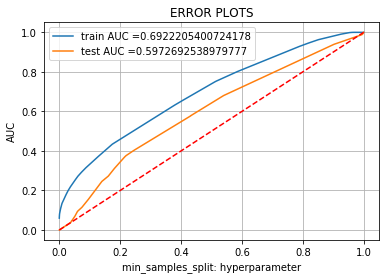

In [56]:
plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.plot([0, 1], [0, 1],'r--') #code copied from -https://stackoverflow.com/questions/25009284/how-to-plot-roc-curve-in-python
plt.legend()
plt.xlabel("min_samples_split: hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

In [30]:
# we are writing our own function for predict, with defined thresould
# we will pick a threshold that will give the least fpr
def predict(proba, threshould, fpr, tpr):
    
    t = threshould[np.argmax(fpr*(1-tpr))]
    
    # (tpr*(1-fpr)) will be maximum if your fpr is very low and tpr is very high
    
    print("the maximum value of tpr*(1-fpr)", max(tpr*(1-fpr)), "for threshold", np.round(t,3))
    predictions = []
    for i in proba:
        if i>=t:
            predictions.append(1)
        else:
            predictions.append(0)
    return predictions

In [19]:
train_conf=confusion_matrix(y_train, predict(preds, tr_thresholds, train_fpr, train_fpr))
test_conf=confusion_matrix(y_test, predict(preds2, tr_thresholds, test_fpr, test_fpr))

the maximum value of tpr*(1-fpr) 0.2474608644880757 for threshold 0.507
the maximum value of tpr*(1-fpr) 0.16229468895650742 for threshold 0.736


In [31]:
#sns heatmap confusion matrix -https://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html
def plot_confusion_matrix(cm, classes,
                          normalize=False,
                          title='Confusion matrix',
                          cmap=plt.cm.Blues):
    """
    This function prints and plots the confusion matrix.
    Normalization can be applied by setting `normalize=True`.
    """
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')

    print(cm)

    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 2.
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        plt.text(j, i, format(cm[i, j], fmt),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

    plt.ylabel('True label')
    plt.xlabel('Predicted label')
    plt.tight_layout()
class_names=['Project Approved','Project Not Approved']

Confusion matrix, without normalization
[[ 1906  1557]
 [ 6532 12450]]


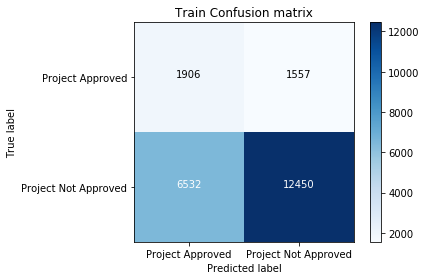

In [73]:

plot_confusion_matrix(train_conf, classes=class_names,
                      title='Train Confusion matrix')

Confusion matrix, without normalization
[[ 2435   111]
 [12878  1076]]


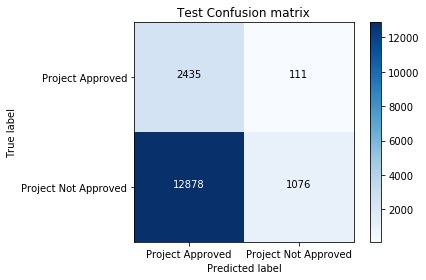

In [74]:
plot_confusion_matrix(test_conf, classes=class_names,
                      title='Test Confusion matrix')

In [159]:
#selecting the false positive data points esssay words
words_FP=[]
X_te=csr_matrix(X_te)
for i in range(16500):
    if(y_test[i]==0 and DT.predict(X_te[i])==1): 
        words_FP.append(X_test['clean_essay'][i])
str1 = ''.join(str(e) for e in words_FP)


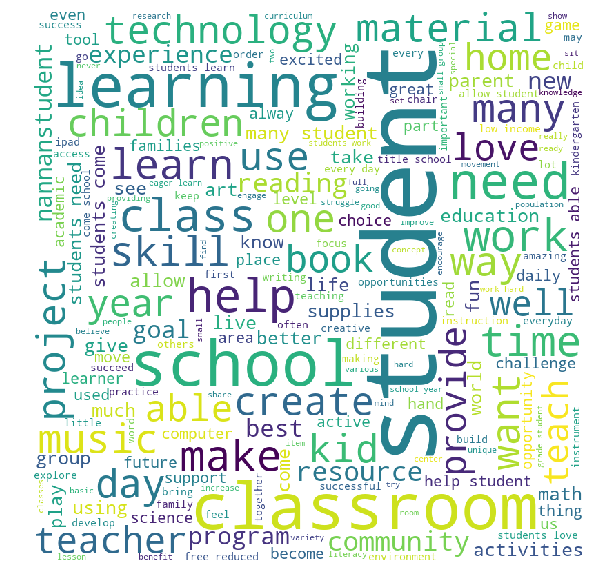

In [162]:
#code copied from -https://www.geeksforgeeks.org/generating-word-cloud-python/
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                min_font_size = 10).generate(str1) 

# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

In [111]:
#selecting the false positive data points price
price_FP=[]
X_te=csr_matrix(X_te)
for i in range(16500):
    if(y_test[i]==0 and DT.predict(X_te[i])==1):
        price_FP.append(X_test_price_norm[i])
price_FP=np.asarray(price_FP).reshape(-1)

In [112]:
price_FP.shape

(519,)

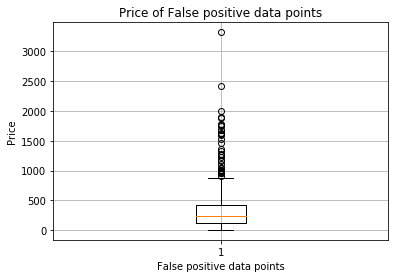

In [113]:
plt.boxplot([price_FP])
plt.title('Price of False positive data points')
plt.xlabel('False positive data points')
plt.ylabel('Price')
plt.grid()
plt.show()

In [118]:
#selecting the false positive data points previously posted project
teacher_FP=[]
X_te=csr_matrix(X_te)
for i in range(16500):
    if(y_test[i]==0 and DT.predict(X_te[i])==1):
        teacher_FP.append(X_test_post_norm[i])
teacher_FP=np.asarray(teacher_FP).reshape(-1)

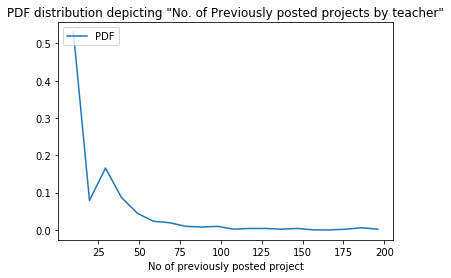

In [121]:
# Choose how many bins you want here
num_bins = 20

# Use the histogram function to bin the data
counts, bin_edges = np.histogram(teacher_FP, bins=num_bins, normed=True)

# Find the pdf
pdf = counts/(sum(counts))


# plot the pdf
plt.plot(bin_edges[1:], pdf, label='PDF')


plt.xlabel('No of previously posted project')
plt.legend(loc='upper left')
plt.title('PDF distribution depicting "No. of Previously posted projects by teacher"')
plt.show()



In [64]:
names=vec_essay.get_feature_names()
clf = DecisionTreeClassifier(max_depth=3)
clf.fit(X_test_essay_bow, y_test)
tree.export_graphviz(clf,out_file='BOW.dot',feature_names=names,class_names=['Project Approved','Project not approved'] )


# Conclusion

### On applying DecisionTree BOW on DonorsChoose dataset with min_samples_split value as 3 we got the AUC value of 0.59 on test data


# Applying DecisionTree on TFIDF

## TFIDF Vectorization of Clean_essay

In [29]:
vec_essay = TfidfVectorizer(min_df=10,ngram_range=(1,4), max_features=5000)
vec_essay.fit(X_train['clean_essay'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_essay_tfidf = vec_essay.transform(X_train['clean_essay'].values)
X_cv_essay_tfidf = vec_essay.transform(X_cv['clean_essay'].values)
X_test_essay_tfidf = vec_essay.transform(X_test['clean_essay'].values)

print("After vectorizations")
print(X_train_essay_tfidf.shape, y_train.shape)
print(X_cv_essay_tfidf.shape, y_cv.shape)
print(X_test_essay_tfidf.shape, y_test.shape)


After vectorizations
(22445, 5000) (22445,)
(11055, 5000) (11055,)
(16500, 5000) (16500,)


## TFIDF Vectorization of Clean_title

In [30]:
vec_title = TfidfVectorizer(min_df=10,ngram_range=(1,4), max_features=5000)
vec_title.fit(X_train['clean_title'].values) # fit has to happen only on train data

# we use the fitted CountVectorizer to convert the text to vector
X_train_title_tfidf = vec_title.transform(X_train['clean_title'].values)
X_cv_title_tfidf = vec_title.transform(X_cv['clean_title'].values)
X_test_title_tfidf = vec_title.transform(X_test['clean_title'].values)

print("After vectorizations")
print(X_train_title_tfidf.shape, y_train.shape)
print(X_cv_title_tfidf.shape, y_cv.shape)
print(X_test_title_tfidf.shape, y_test.shape)


After vectorizations
(22445, 1659) (22445,)
(11055, 1659) (11055,)
(16500, 1659) (16500,)


# Concatenation of all the vectorized data

In [46]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039

X_tr = hstack((X_train_essay_tfidf,X_train_state_ohe,X_train_teacher_ohe,X_train_grade_ohe,X_train_title_tfidf,X_train_category_ohe,X_train_subcategory_ohe,X_train_price_norm,X_train_post_norm,X_train_digit_norm,X_train_quantity_norm))
X_cr = hstack((X_cv_essay_tfidf,X_cv_state_ohe,X_cv_teacher_ohe,X_cv_grade_ohe,X_cv_title_tfidf,X_cv_category_ohe,X_cv_subcategory_ohe,X_cv_price_norm,X_cv_post_norm,X_cv_digit_norm,X_cv_quantity_norm))
X_te = hstack((X_test_essay_tfidf,X_test_state_ohe,X_test_teacher_ohe,X_test_grade_ohe,X_test_title_tfidf,X_test_category_ohe,X_test_subcategory_ohe,X_test_price_norm,X_test_post_norm,X_test_digit_norm,X_test_quantity_norm))

print("Final Data matrix")
print(X_tr.shape, y_train.shape)
print(X_cr.shape, y_cv.shape)
print(X_te.shape, y_test.shape)
print("="*100)

Final Data matrix
(22445, 6760) (22445,)
(11055, 6760) (11055,)
(16500, 6760) (16500,)


In [32]:
# https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html

DT = DecisionTreeClassifier(class_weight='balanced', splitter='random')

parameters = {'max_depth':[1, 5, 10, 50, 100, 500],'min_samples_split':[5, 10, 50, 100, 500]}
clf = GridSearchCV(DT, parameters, cv=3, scoring='roc_auc')
clf.fit(X_tr, y_train)

train_auc= clf.cv_results_['mean_train_score']
train_auc_std= clf.cv_results_['std_train_score']
cv_auc = clf.cv_results_['mean_test_score'] 
cv_auc_std= clf.cv_results_['std_test_score']



In [33]:
# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=parameters['max_depth'],y=parameters['min_samples_split'],z=train_auc, name = 'train')
trace2 = go.Scatter3d(x=parameters['max_depth'],y=parameters['min_samples_split'],z=cv_auc, name = 'Cross validation')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='max_depth'),
        yaxis = dict(title='min_samples_split'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

In [47]:
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve

best_sample_split = 5


DT = DecisionTreeClassifier(max_depth=10, min_samples_split=best_sample_split, class_weight='balanced', splitter='random')
DT.fit(X_tr, y_train)

y_train_pred = DT.predict_proba(X_tr)
preds = y_train_pred[:,1]
y_test_pred = DT.predict_proba(X_te)
preds2=y_test_pred[:,1]

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, preds)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, preds2)



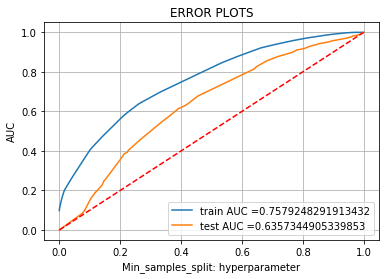

In [30]:
plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.plot([0, 1], [0, 1],'r--') #code copied from -https://stackoverflow.com/questions/25009284/how-to-plot-roc-curve-in-python
plt.legend()
plt.xlabel("Min_samples_split: hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

In [23]:
train_conf=confusion_matrix(y_train, predict(preds, tr_thresholds, train_fpr, train_fpr))
test_conf=confusion_matrix(y_test, predict(preds2, tr_thresholds, test_fpr, test_fpr))

the maximum value of tpr*(1-fpr) 0.24771602675001078 for threshold 0.424
the maximum value of tpr*(1-fpr) 0.24735256203375564 for threshold 0.424


Confusion matrix, without normalization
[[ 1665  1798]
 [ 3121 15861]]


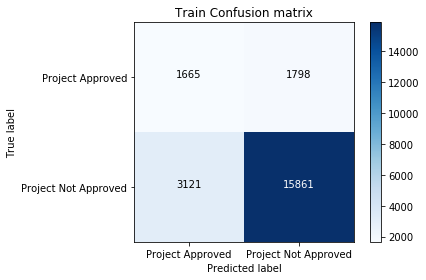

In [28]:
plot_confusion_matrix(train_conf, classes=class_names,
                      title='Train Confusion matrix')

Confusion matrix, without normalization
[[  914  1632]
 [ 2578 11376]]


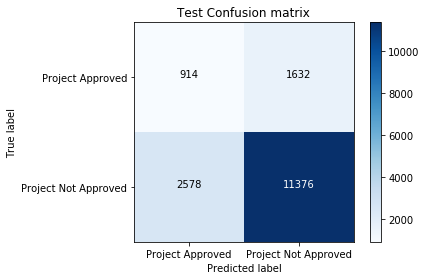

In [29]:
plot_confusion_matrix(test_conf, classes=class_names,
                      title='Test Confusion matrix')

In [25]:
#selecting the false positive data points esssay words
TFIDF_words_FP=[]
X_te=csr_matrix(X_te)
for i in range(16500):
    if(y_test[i]==0 and DT.predict(X_te[i])==1): 
        TFIDF_words_FP.append(X_test['clean_essay'][i])
str2 = ''.join(str(e) for e in TFIDF_words_FP)


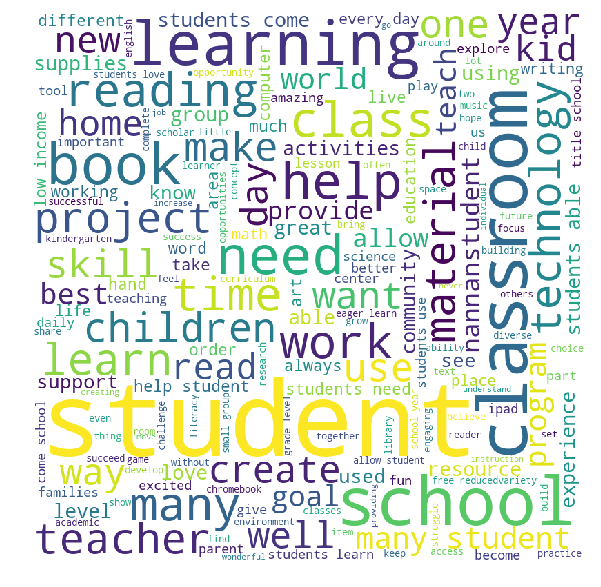

In [32]:
#code copied from -https://www.geeksforgeeks.org/generating-word-cloud-python/
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                min_font_size = 10).generate(str2) 

# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

In [34]:
#selecting the false positive data points price
price_FP=[]
X_te=csr_matrix(X_te)
for i in range(16500):
    if(y_test[i]==0 and DT.predict(X_te[i])==1):
        price_FP.append(X_test_price_norm[i])
price_FP=np.asarray(price_FP).reshape(-1)

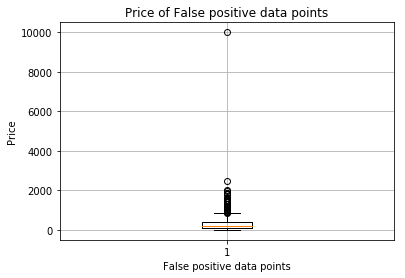

In [35]:
plt.boxplot([price_FP])
plt.title('Price of False positive data points')
plt.xlabel('False positive data points')
plt.ylabel('Price')
plt.grid()
plt.show()

In [36]:
#selecting the false positive data points previously posted project
teacher_FP=[]
X_te=csr_matrix(X_te)
for i in range(16500):
    if(y_test[i]==0 and DT.predict(X_te[i])==1):
        teacher_FP.append(X_test_post_norm[i])
teacher_FP=np.asarray(teacher_FP).reshape(-1)

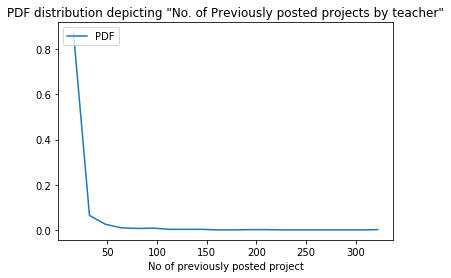

In [37]:
# Choose how many bins you want here
num_bins = 20

# Use the histogram function to bin the data
counts, bin_edges = np.histogram(teacher_FP, bins=num_bins, normed=True)

# Find the pdf
pdf = counts/(sum(counts))


# plot the pdf
plt.plot(bin_edges[1:], pdf, label='PDF')


plt.xlabel('No of previously posted project')
plt.legend(loc='upper left')
plt.title('PDF distribution depicting "No. of Previously posted projects by teacher"')
plt.show()



In [67]:
names=vec_essay.get_feature_names()
clf = DecisionTreeClassifier(max_depth=3)
clf.fit(X_test_essay_tfidf, y_test)
tree.export_graphviz(clf,out_file='TFIDF.dot',feature_names=names,class_names=['Project Approved','Project not approved'] )



# Conclusion

### On applying DecisionTree TFIDF on DonorsChoose dataset with min_samples_split value as 5 we got the AUC value of 0.63 on test data


# Applying DecisionTree on AVG W2V

## AVG_W2V Vectorization of Clean_essay

In [34]:
# stronging variables into pickle files python: http://www.jessicayung.com/how-to-use-pickle-to-save-and-load-variables-in-python/
# make sure you have the glove_vectors file

with open('glove_vectors.txt', 'rb') as f:
    model = pickle.load(f)
    glove_words =  set(model.keys())

In [35]:
# average Word2Vec
# compute average word2vec for each review.
avg_w2v_vectors_essay = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in X['clean_essay'].values: # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_essay.append(vector)



## AVG_W2V Vectorization of Clean_title

In [36]:
# Similarly you can vectorize for title also
avg_w2v_vectors_title = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in X['clean_title'].values: # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    cnt_words =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if word in glove_words:
            vector += model[word]
            cnt_words += 1
    if cnt_words != 0:
        vector /= cnt_words
    avg_w2v_vectors_title.append(vector)

In [37]:
avg_w2v_vectors_title=csr_matrix(avg_w2v_vectors_title)
avg_w2v_vectors_essay=csr_matrix(avg_w2v_vectors_essay)
avg_w2v_vectors_title.shape

(50000, 300)

In [38]:
#splitting avg_w2v_vectors_title into train and test
X_train_avg_t, X_test_avg_t, y_train, y_test = train_test_split(avg_w2v_vectors_title, y, test_size=0.33, stratify=y, random_state=0)
X_train_avg_title, X_cv_avg_title, y_train, y_cv = train_test_split(X_train_avg_t, y_train, test_size=0.33, stratify=y_train, random_state=0)


In [39]:
#splitting avg_w2v_vectors_essay into train and test
X_train_avg_e, X_test_avg_e, y_train, y_test = train_test_split(avg_w2v_vectors_essay, y, test_size=0.33, stratify=y, random_state=0)
X_train_avg_essay, X_cv_avg_essay, y_train, y_cv = train_test_split(X_train_avg_e, y_train, test_size=0.33, stratify=y_train, random_state=0)


# Concatenation of all the vectorized data

In [40]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039

X_tr = hstack((X_train_avg_title,X_train_avg_essay,X_train_state_ohe,X_train_teacher_ohe,X_train_grade_ohe,X_train_category_ohe,X_train_subcategory_ohe,X_train_price_norm,X_train_post_norm,X_train_digit_norm,X_train_quantity_norm))
X_cr = hstack((X_cv_avg_title,X_cv_avg_essay,X_cv_state_ohe,X_cv_teacher_ohe,X_cv_grade_ohe,X_cv_category_ohe,X_cv_subcategory_ohe,X_cv_price_norm,X_cv_post_norm,X_cv_digit_norm,X_cv_quantity_norm))
X_te = hstack((X_test_avg_t,X_test_avg_e,X_test_state_ohe,X_test_teacher_ohe,X_test_grade_ohe,X_test_category_ohe,X_test_subcategory_ohe,X_test_price_norm,X_test_post_norm,X_test_digit_norm,X_test_quantity_norm))

print("Final Data matrix")
print(X_tr.shape, y_train.shape)
print(X_cr.shape, y_cv.shape)
print(X_te.shape, y_test.shape)
print("="*100)

Final Data matrix
(22445, 701) (22445,)
(11055, 701) (11055,)
(16500, 701) (16500,)


In [41]:
# https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html

DT = DecisionTreeClassifier(class_weight='balanced', splitter='random')

parameters = {'max_depth':[1, 5, 10, 50, 100, 500],'min_samples_split':[5, 10, 50, 100, 500]}
clf = GridSearchCV(DT, parameters, cv=3, scoring='roc_auc')
clf.fit(X_tr, y_train)

train_auc= clf.cv_results_['mean_train_score']
train_auc_std= clf.cv_results_['std_train_score']
cv_auc = clf.cv_results_['mean_test_score'] 
cv_auc_std= clf.cv_results_['std_test_score']



In [42]:
# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=parameters['max_depth'],y=parameters['min_samples_split'],z=train_auc, name = 'train')
trace2 = go.Scatter3d(x=parameters['max_depth'],y=parameters['min_samples_split'],z=cv_auc, name = 'Cross validation')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='max_depth'),
        yaxis = dict(title='min_samples_split'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

In [80]:
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve

best_sample_split = 5


DT = DecisionTreeClassifier(max_depth=5, min_samples_split=best_sample_split, class_weight='balanced', splitter='random')
DT.fit(X_tr, y_train)

y_train_pred = DT.predict_proba(X_tr)
preds = y_train_pred[:,1]
y_test_pred = DT.predict_proba(X_te)
preds2=y_test_pred[:,1]

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, preds)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, preds2)



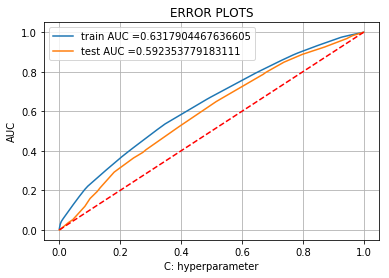

In [44]:
plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.plot([0, 1], [0, 1],'r--') #code copied from -https://stackoverflow.com/questions/25009284/how-to-plot-roc-curve-in-python
plt.legend()
plt.xlabel("C: hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

In [45]:
train_conf=confusion_matrix(y_train, predict(preds, tr_thresholds, train_fpr, train_fpr))
test_conf=confusion_matrix(y_test, predict(preds2, tr_thresholds, test_fpr, test_fpr))

the maximum value of tpr*(1-fpr) 0.2499964769262854 for threshold 0.463
the maximum value of tpr*(1-fpr) 0.2497653543997053 for threshold 0.463


Confusion matrix, without normalization
[[ 1738  1725]
 [ 6219 12763]]


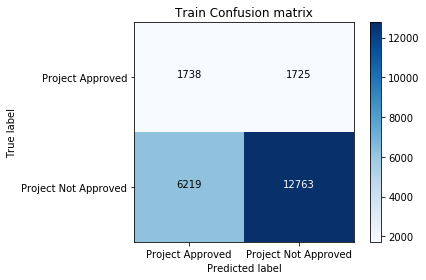

In [46]:
plot_confusion_matrix(train_conf, classes=class_names,
                      title='Train Confusion matrix')

Confusion matrix, without normalization
[[1199 1347]
 [4724 9230]]


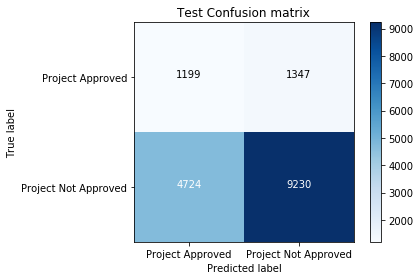

In [47]:
plot_confusion_matrix(test_conf, classes=class_names,
                      title='Test Confusion matrix')

In [81]:
#selecting the false positive data points esssay words
words_FP=[]
X_te=csr_matrix(X_te)
for i in range(16500):
    if(y_test[i]==0 and DT.predict(X_te[i])==1): 
        words_FP.append(X_test['clean_essay'][i])
str2 = ''.join(str(e) for e in words_FP)


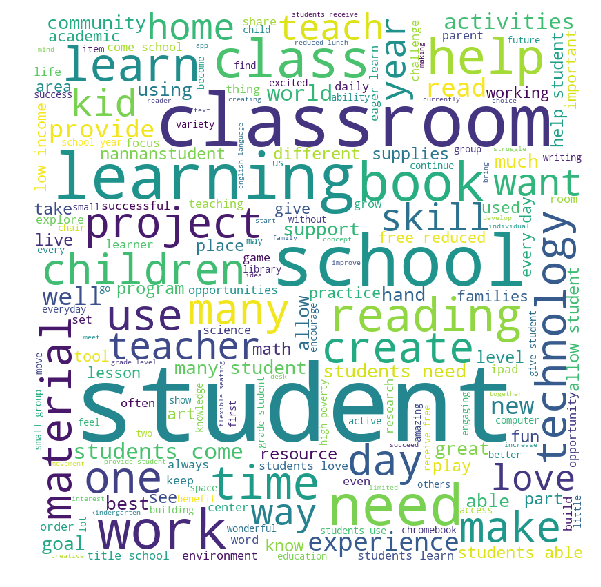

In [82]:
#code copied from -https://www.geeksforgeeks.org/generating-word-cloud-python/
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                min_font_size = 10).generate(str2) 

# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

In [83]:
#selecting the false positive data points price
price_FP=[]
X_te=csr_matrix(X_te)
for i in range(16500):
    if(y_test[i]==0 and DT.predict(X_te[i])==1):
        price_FP.append(X_test_price_norm[i])
price_FP=np.asarray(price_FP).reshape(-1)

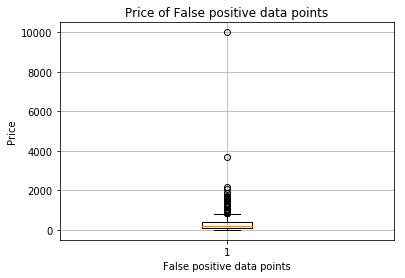

In [84]:
plt.boxplot([price_FP])
plt.title('Price of False positive data points')
plt.xlabel('False positive data points')
plt.ylabel('Price')
plt.grid()
plt.show()

In [87]:
#selecting the false positive data points previously posted project
avg_teacher_FP=[]
X_te=csr_matrix(X_te)
for i in range(16500):
    if(y_test[i]==0 and DT.predict(X_te[i])==1):
        avg_teacher_FP.append(X_test_post_norm[i])
avg_teacher_FP=np.asarray(avg_teacher_FP).reshape(-1)

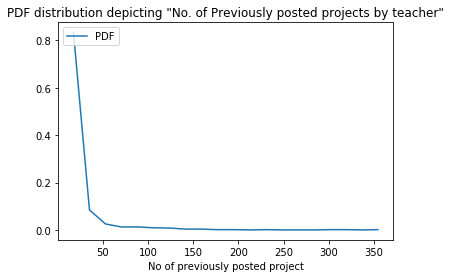

In [88]:
# Choose how many bins you want here
num_bins = 20

# Use the histogram function to bin the data
counts, bin_edges = np.histogram(avg_teacher_FP, bins=num_bins, normed=True)

# Find the pdf
pdf = counts/(sum(counts))


# plot the pdf
plt.plot(bin_edges[1:], pdf, label='PDF')


plt.xlabel('No of previously posted project')
plt.legend(loc='upper left')
plt.title('PDF distribution depicting "No. of Previously posted projects by teacher"')
plt.show()



# Conclusion

### On applying DecisionTree AVG W2V on DonorsChoose dataset with min_samples_split value as 5 we got the AUC value of 0.59 on test data


# Applying DecisionTree on TFIDF W2V

## TFIDF_W2V Vectorization of Clean_essay

In [89]:
# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
tfidf_model = TfidfVectorizer()
tfidf_model.fit(X['clean_essay'].values)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

In [90]:
# average Word2Vec
# compute average word2vec for each review.
tfidf_w2v_vectors_essay = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in X['clean_essay'].values: # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_essay.append(vector)



## TFIDF_W2V Vectorization of Clean_title

In [91]:
# Similarly you can vectorize for title also
# S = ["abc def pqr", "def def def abc", "pqr pqr def"]
tfidf_model = TfidfVectorizer()
tfidf_model.fit(X['clean_title'].values)
# we are converting a dictionary with word as a key, and the idf as a value
dictionary = dict(zip(tfidf_model.get_feature_names(), list(tfidf_model.idf_)))
tfidf_words = set(tfidf_model.get_feature_names())

In [92]:
# average Word2Vec
# compute average word2vec for each review.
tfidf_w2v_vectors_title = []; # the avg-w2v for each sentence/review is stored in this list
for sentence in X['clean_title'].values: # for each review/sentence
    vector = np.zeros(300) # as word vectors are of zero length
    tf_idf_weight =0; # num of words with a valid vector in the sentence/review
    for word in sentence.split(): # for each word in a review/sentence
        if (word in glove_words) and (word in tfidf_words):
            vec = model[word] # getting the vector for each word
            # here we are multiplying idf value(dictionary[word]) and the tf value((sentence.count(word)/len(sentence.split())))
            tf_idf = dictionary[word]*(sentence.count(word)/len(sentence.split())) # getting the tfidf value for each word
            vector += (vec * tf_idf) # calculating tfidf weighted w2v
            tf_idf_weight += tf_idf
    if tf_idf_weight != 0:
        vector /= tf_idf_weight
    tfidf_w2v_vectors_title.append(vector)



In [93]:
tfidf_w2v_vectors_title=csr_matrix(tfidf_w2v_vectors_title)
tfidf_w2v_vectors_essay=csr_matrix(tfidf_w2v_vectors_essay)
tfidf_w2v_vectors_title.shape

(50000, 300)

In [94]:
#splitting tfidf_w2v_vectors_title into train and test
X_train_tfidf_t, X_test_tfidf_t, y_train, y_test = train_test_split(tfidf_w2v_vectors_title, y, test_size=0.33, stratify=y)
X_train_tfidf_title, X_cv_tfidf_title, y_train, y_cv = train_test_split(X_train_tfidf_t, y_train, test_size=0.33, stratify=y_train)


In [95]:
#splitting tfidf_w2v_vectors_title into train and test
X_train_tfidf_e, X_test_tfidf_e, y_train, y_test = train_test_split(tfidf_w2v_vectors_essay, y, test_size=0.33, stratify=y)
X_train_tfidf_essay, X_cv_tfidf_essay, y_train, y_cv = train_test_split(X_train_tfidf_e, y_train, test_size=0.33, stratify=y_train)


# Concatenation of all the vectorized data

In [96]:
# merge two sparse matrices: https://stackoverflow.com/a/19710648/4084039

X_tr = hstack((X_train_tfidf_essay,X_train_tfidf_title,X_train_state_ohe,X_train_teacher_ohe,X_train_grade_ohe,X_train_category_ohe,X_train_subcategory_ohe,X_train_price_norm,X_train_post_norm,X_train_digit_norm,X_train_quantity_norm))
X_cr = hstack((X_cv_tfidf_essay,X_cv_tfidf_title,X_cv_state_ohe,X_cv_teacher_ohe,X_cv_grade_ohe,X_cv_category_ohe,X_cv_subcategory_ohe,X_cv_price_norm,X_cv_post_norm,X_cv_digit_norm,X_cv_quantity_norm))
X_te = hstack((X_test_tfidf_e,X_test_tfidf_t,X_test_state_ohe,X_test_teacher_ohe,X_test_grade_ohe,X_test_category_ohe,X_test_subcategory_ohe,X_test_price_norm,X_test_post_norm,X_test_digit_norm,X_test_quantity_norm))

print("Final Data matrix")
print(X_tr.shape, y_train.shape)
print(X_cr.shape, y_cv.shape)
print(X_te.shape, y_test.shape)
print("="*100)

Final Data matrix
(22445, 701) (22445,)
(11055, 701) (11055,)
(16500, 701) (16500,)


In [56]:
# https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html

DT = DecisionTreeClassifier(class_weight='balanced', splitter='random')

parameters = {'max_depth':[1, 5, 10, 50, 100, 500],'min_samples_split':[5, 10, 50, 100, 500]}
clf = GridSearchCV(DT, parameters, cv=3, scoring='roc_auc')
clf.fit(X_tr, y_train)

train_auc= clf.cv_results_['mean_train_score']
train_auc_std= clf.cv_results_['std_train_score']
cv_auc = clf.cv_results_['mean_test_score'] 
cv_auc_std= clf.cv_results_['std_test_score']



In [43]:
# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=parameters['max_depth'],y=parameters['min_samples_split'],z=train_auc, name = 'train')
trace2 = go.Scatter3d(x=parameters['max_depth'],y=parameters['min_samples_split'],z=cv_auc, name = 'Cross validation')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='max_depth'),
        yaxis = dict(title='min_samples_split'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

In [97]:
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve

best_sample_split = 10


DT = DecisionTreeClassifier(max_depth=5, min_samples_split=best_sample_split, class_weight='balanced', splitter='random')
DT.fit(X_tr, y_train)

y_train_pred = DT.predict_proba(X_tr)
preds = y_train_pred[:,1]
y_test_pred = DT.predict_proba(X_te)
preds2=y_test_pred[:,1]

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, preds)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, preds2)



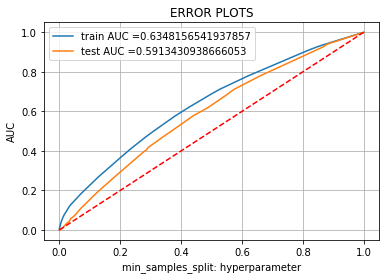

In [62]:
plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.plot([0, 1], [0, 1],'r--') #code copied from -https://stackoverflow.com/questions/25009284/how-to-plot-roc-curve-in-python
plt.legend()
plt.xlabel("min_samples_split: hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

In [63]:
train_conf=confusion_matrix(y_train, predict(preds, tr_thresholds, train_fpr, train_fpr))
test_conf=confusion_matrix(y_test, predict(preds2, tr_thresholds, test_fpr, test_fpr))

the maximum value of tpr*(1-fpr) 0.24999897851708863 for threshold 0.477
the maximum value of tpr*(1-fpr) 0.24989571306653569 for threshold 0.477


Confusion matrix, without normalization
[[ 1735  1728]
 [ 5929 13053]]


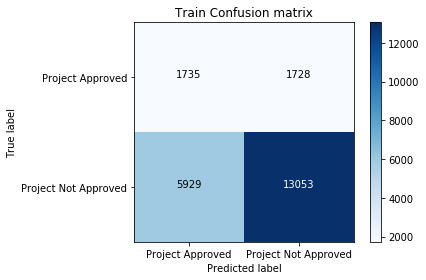

In [64]:
plot_confusion_matrix(train_conf, classes=class_names,
                      title='Train Confusion matrix')

Confusion matrix, without normalization
[[1147 1399]
 [4415 9539]]


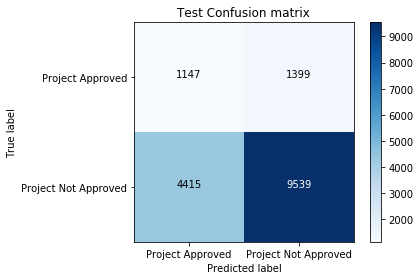

In [65]:
plot_confusion_matrix(test_conf, classes=class_names,
                      title='Test Confusion matrix')

In [98]:
#selecting the false positive data points esssay words
words_FP=[]
X_te=csr_matrix(X_te)
for i in range(16500):
    if(y_test[i]==0 and DT.predict(X_te[i])==1): 
        words_FP.append(X_test['clean_essay'][i])
str2 = ''.join(str(e) for e in words_FP)


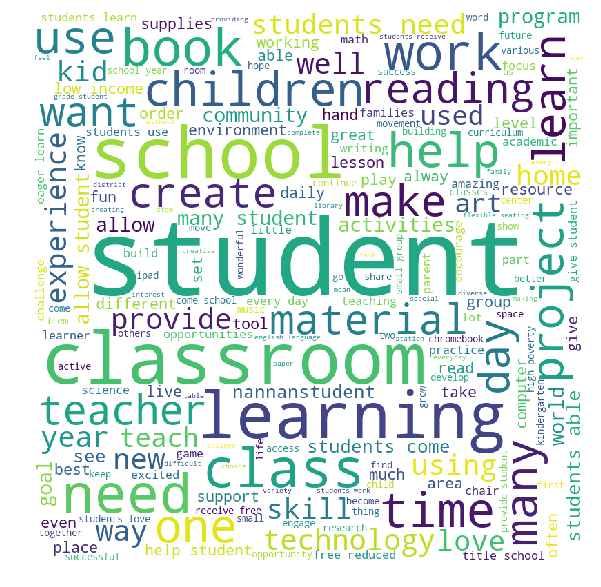

In [99]:
#code copied from -https://www.geeksforgeeks.org/generating-word-cloud-python/
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                min_font_size = 10).generate(str2) 

# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

In [100]:
#selecting the false positive data points price
price_FP=[]
X_te=csr_matrix(X_te)
for i in range(16500):
    if(y_test[i]==0 and DT.predict(X_te[i])==1):
        price_FP.append(X_test_price_norm[i])
price_FP=np.asarray(price_FP).reshape(-1)

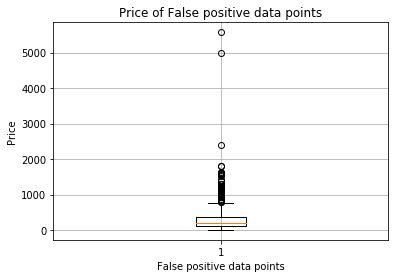

In [101]:
plt.boxplot([price_FP])
plt.title('Price of False positive data points')
plt.xlabel('False positive data points')
plt.ylabel('Price')
plt.grid()
plt.show()

In [102]:
#selecting the false positive data points previously posted project
avg_teacher_FP=[]
X_te=csr_matrix(X_te)
for i in range(16500):
    if(y_test[i]==0 and DT.predict(X_te[i])==1):
        avg_teacher_FP.append(X_test_post_norm[i])
avg_teacher_FP=np.asarray(avg_teacher_FP).reshape(-1)

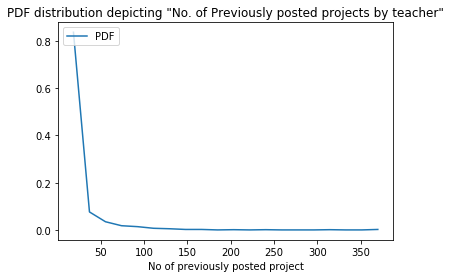

In [103]:
# Choose how many bins you want here
num_bins = 20

# Use the histogram function to bin the data
counts, bin_edges = np.histogram(avg_teacher_FP, bins=num_bins, normed=True)

# Find the pdf
pdf = counts/(sum(counts))


# plot the pdf
plt.plot(bin_edges[1:], pdf, label='PDF')


plt.xlabel('No of previously posted project')
plt.legend(loc='upper left')
plt.title('PDF distribution depicting "No. of Previously posted projects by teacher"')
plt.show()



# Conclusion

### On applying DecisionTree TFIDF W2V on DonorsChoose dataset with min_samples_split value as 10 we got the AUC value of 0.59 on test data


# DecisionTree with top 5k Features on TFIDF

In [48]:
from sklearn.feature_selection import SelectFromModel as SFM
top5k = SFM(DT,max_features=5000, threshold=-np.inf,prefit=True)
top5k_X_tr = top5k.transform(X_tr)
top5k_X_cr = top5k.transform(X_cr)
top5k_X_te = top5k.transform(X_te)

print("Final Data matrix")
print(top5k_X_tr.shape, y_train.shape)
print(top5k_X_cr.shape, y_cv.shape)
print(top5k_X_te.shape, y_test.shape)
print("="*100)

Final Data matrix
(22445, 5000) (22445,)
(11055, 5000) (11055,)
(16500, 5000) (16500,)


In [49]:
# https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.GridSearchCV.html

DT = DecisionTreeClassifier(class_weight='balanced', splitter='random')

parameters = {'max_depth':[1, 5, 10, 50, 100, 500],'min_samples_split':[5, 10, 50, 100, 500]}
clf = GridSearchCV(DT, parameters, cv=3, scoring='roc_auc')
clf.fit(top5k_X_tr, y_train)

train_auc= clf.cv_results_['mean_train_score']
train_auc_std= clf.cv_results_['std_train_score']
cv_auc = clf.cv_results_['mean_test_score'] 
cv_auc_std= clf.cv_results_['std_test_score']



In [50]:
# https://plot.ly/python/3d-axes/
trace1 = go.Scatter3d(x=parameters['max_depth'],y=parameters['min_samples_split'],z=train_auc, name = 'train')
trace2 = go.Scatter3d(x=parameters['max_depth'],y=parameters['min_samples_split'],z=cv_auc, name = 'Cross validation')
data = [trace1, trace2]

layout = go.Layout(scene = dict(
        xaxis = dict(title='max_depth'),
        yaxis = dict(title='min_samples_split'),
        zaxis = dict(title='AUC'),))

fig = go.Figure(data=data, layout=layout)
offline.iplot(fig, filename='3d-scatter-colorscale')

In [28]:
# https://scikit-learn.org/stable/modules/generated/sklearn.metrics.roc_curve.html#sklearn.metrics.roc_curve

best_sample_split = 50


DT = DecisionTreeClassifier(max_depth=5, min_samples_split=best_sample_split, class_weight='balanced', splitter='random')
DT.fit(X_tr, y_train)

y_train_pred = DT.predict_proba(X_tr)
preds = y_train_pred[:,1]
y_test_pred = DT.predict_proba(X_te)
preds2=y_test_pred[:,1]

train_fpr, train_tpr, tr_thresholds = roc_curve(y_train, preds)
test_fpr, test_tpr, te_thresholds = roc_curve(y_test, preds2)



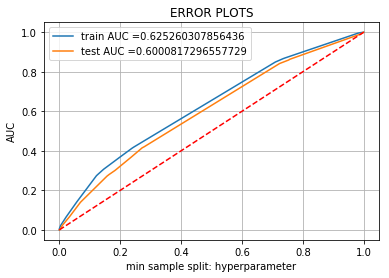

In [29]:
plt.plot(train_fpr, train_tpr, label="train AUC ="+str(auc(train_fpr, train_tpr)))
plt.plot(test_fpr, test_tpr, label="test AUC ="+str(auc(test_fpr, test_tpr)))
plt.plot([0, 1], [0, 1],'r--') #code copied from -https://stackoverflow.com/questions/25009284/how-to-plot-roc-curve-in-python
plt.legend()
plt.xlabel("min sample split: hyperparameter")
plt.ylabel("AUC")
plt.title("ERROR PLOTS")
plt.grid()
plt.show()

In [33]:
train_conf=confusion_matrix(y_train, predict(preds, tr_thresholds, train_fpr, train_fpr))
test_conf=confusion_matrix(y_test, predict(preds2, tr_thresholds, test_fpr, test_fpr))

the maximum value of tpr*(1-fpr) 0.20598849151489582 for threshold 0.48
the maximum value of tpr*(1-fpr) 0.20110099850110674 for threshold 0.498


Confusion matrix, without normalization
[[ 1005  2458]
 [ 2862 16120]]


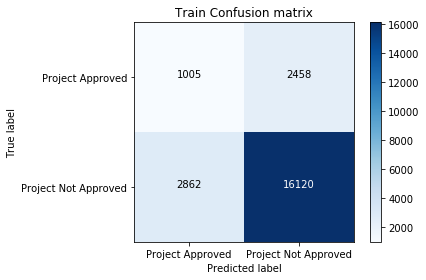

In [34]:
plot_confusion_matrix(train_conf, classes=class_names,
                      title='Train Confusion matrix')

Confusion matrix, without normalization
[[1836  710]
 [8085 5869]]


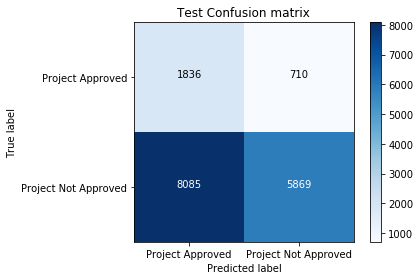

In [35]:
plot_confusion_matrix(test_conf, classes=class_names,
                      title='Test Confusion matrix')

In [36]:
#selecting the false positive data points esssay words
words_FP=[]
X_te=csr_matrix(X_te)
for i in range(16500):
    if(y_test[i]==0 and DT.predict(X_te[i])==1): 
        words_FP.append(X_test['clean_essay'][i])
str2 = ''.join(str(e) for e in words_FP)


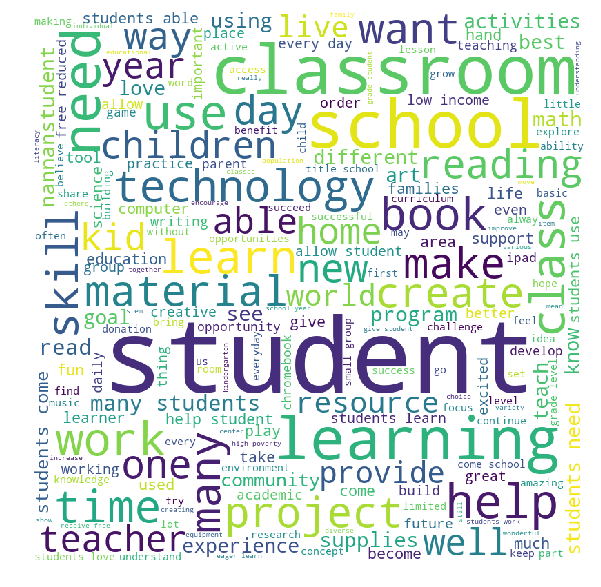

In [37]:
#code copied from -https://www.geeksforgeeks.org/generating-word-cloud-python/
wordcloud = WordCloud(width = 800, height = 800, 
                background_color ='white', 
                min_font_size = 10).generate(str2) 

# plot the WordCloud image                        
plt.figure(figsize = (8, 8), facecolor = None) 
plt.imshow(wordcloud) 
plt.axis("off") 
plt.tight_layout(pad = 0) 
  
plt.show() 

In [38]:
#selecting the false positive data points price
price_FP=[]
X_te=csr_matrix(X_te)
for i in range(16500):
    if(y_test[i]==0 and DT.predict(X_te[i])==1):
        price_FP.append(X_test_price_norm[i])
price_FP=np.asarray(price_FP).reshape(-1)

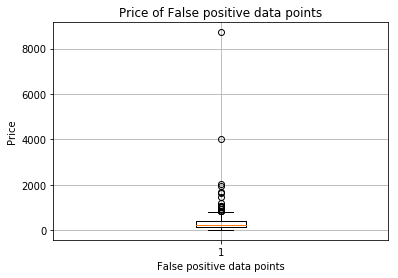

In [39]:
plt.boxplot([price_FP])
plt.title('Price of False positive data points')
plt.xlabel('False positive data points')
plt.ylabel('Price')
plt.grid()
plt.show()

In [40]:
#selecting the false positive data points previously posted project
avg_teacher_FP=[]
X_te=csr_matrix(X_te)
for i in range(16500):
    if(y_test[i]==0 and DT.predict(X_te[i])==1):
        avg_teacher_FP.append(X_test_post_norm[i])
avg_teacher_FP=np.asarray(avg_teacher_FP).reshape(-1)

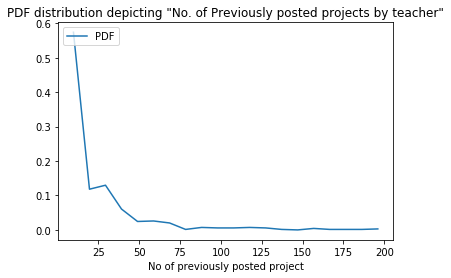

In [41]:
# Choose how many bins you want here
num_bins = 20

# Use the histogram function to bin the data
counts, bin_edges = np.histogram(avg_teacher_FP, bins=num_bins, normed=True)

# Find the pdf
pdf = counts/(sum(counts))


# plot the pdf
plt.plot(bin_edges[1:], pdf, label='PDF')


plt.xlabel('No of previously posted project')
plt.legend(loc='upper left')
plt.title('PDF distribution depicting "No. of Previously posted projects by teacher"')
plt.show()



## Conclusion

### On applying DecisionTree with top 5k features on DonorsChoose dataset with min sample split value as 50 we got the AUC value of 0.60 on test data


In [42]:
#code copied from -http://zetcode.com/python/prettytable/
   
x = PrettyTable()
x.field_names = ["Vectorizer", "Max depth","Min sample split", "AUC"]
x.add_row(["BOW",  10,3, 0.597])
x.add_row(["TFIDF",  10,5,0.635])
x.add_row(["AVG W2V",  5,5,0.592])
x.add_row(["TFIDF W2V",  5,10,0.591])
x.add_row(["top 5k features",  5,50,0.601])
print(x)

+-----------------+-----------+------------------+-------+
|    Vectorizer   | Max depth | Min sample split |  AUC  |
+-----------------+-----------+------------------+-------+
|       BOW       |     10    |        3         | 0.597 |
|      TFIDF      |     10    |        5         | 0.635 |
|     AVG W2V     |     5     |        5         | 0.592 |
|    TFIDF W2V    |     5     |        10        | 0.591 |
| top 5k features |     5     |        50        | 0.601 |
+-----------------+-----------+------------------+-------+


# Conclusion- The best vectorizer was found to be TFIDF while applying DecisionTree